In [10]:
import os
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from collections import Counter
import pandas as pd





# ====================== ======================
if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True


DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IMAGE_SIZE = 128
CENTER_CROP_SIZE = 178
BATCH_SIZE = 256 # hardcoded but dont worry 
NUM_WORKERS = 4
RANDOM_SEED = 42
OUTPUT_DIR = '/kaggle/working'

np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

print(f"  Device: {DEVICE}")
print(f"  Image size: {IMAGE_SIZE}×{IMAGE_SIZE}")
print(f"  Batch size: {BATCH_SIZE}")

# ====================== مسیرها ======================
CELEBA_BASE = '/kaggle/input/celeba-dataset'
ATTR_FILE = os.path.join(CELEBA_BASE, 'list_attr_celeba.csv')

img_candidate_1 = os.path.join(CELEBA_BASE, 'img_align_celeba', 'img_align_celeba')
img_candidate_2 = os.path.join(CELEBA_BASE, 'img_align_celeba')

if os.path.isdir(img_candidate_1):
    sample_files = os.listdir(img_candidate_1)[:5]
    if any(f.endswith('.jpg') for f in sample_files):
        IMG_DIR = img_candidate_1
    else:
        IMG_DIR = img_candidate_2
elif os.path.isdir(img_candidate_2):
    IMG_DIR = img_candidate_2
else:
    raise FileNotFoundError(" پوشه تصاویر پیدا نشد!")

print(f"\n  IMG_DIR  : {IMG_DIR}")
print(f"  ATTR_FILE: {ATTR_FILE}")

num_images = len([f for f in os.listdir(IMG_DIR) if f.endswith('.jpg')])
print(f"  Number of images: {num_images:,}")


  Device: cuda
  Image size: 128×128
  Batch size: 256

  IMG_DIR  : /kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba
  ATTR_FILE: /kaggle/input/celeba-dataset/list_attr_celeba.csv
  Number of images: 202,599


In [11]:
# ====================================================================
# ====================================================================

class CelebAKaggle(Dataset):
   
    
    def __init__(self, img_dir, attr_file, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        
        print(" Loading attributes CSV...")
        df = pd.read_csv(attr_file)
        
        self.filenames = df.iloc[:, 0].tolist()
        self.attr_names = list(df.columns[1:])
        
        attr_values = df.iloc[:, 1:].values.astype(np.int64)
        attr_values = np.where(attr_values == -1, 0, attr_values)
        self.attributes = torch.tensor(attr_values, dtype=torch.long)
        
        print(f" Loaded: {len(self.filenames):,} images, {len(self.attr_names)} attributes")
        print(f"   Sample attributes: {self.attr_names[:5]}")
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.filenames[idx])
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image, self.attributes[idx]


# ====================== Transform ======================
train_transform = transforms.Compose([
    transforms.CenterCrop(CENTER_CROP_SIZE),
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# ======================  ======================
celeba_dataset = CelebAKaggle(
    img_dir=IMG_DIR,
    attr_file=ATTR_FILE,
    transform=train_transform
)


 Loading attributes CSV...
 Loaded: 202,599 images, 40 attributes
   Sample attributes: ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald']


In [12]:
# ====================================================================
# فیلتر و توازن: Black_Hair و Brown_Hair
# ====================================================================

print("=" * 60)
print("filter data")
print("=" * 60)

attr_names = celeba_dataset.attr_names
all_attrs = celeba_dataset.attributes

# پیدا کردن ایندکس ویژگی‌ها
black_idx = attr_names.index('Black_Hair')
brown_idx = attr_names.index('Brown_Hair')
print(f"Black_Hair attribute index: {black_idx}")
print(f"Brown_Hair attribute index: {brown_idx}")

# دسته‌بندی تصاویر
only_black = []
only_brown = []
both = []

for i in range(len(celeba_dataset)):
    has_black = all_attrs[i][black_idx].item() == 1
    has_brown = all_attrs[i][brown_idx].item() == 1
    
    if has_black and has_brown:
        both.append(i)
    elif has_black:
        only_black.append(i)
    elif has_brown:
        only_brown.append(i)

print(f"\n stat:")
print(f"  Only Black_Hair : {len(only_black):>8,}")
print(f"  Only Brown_Hair : {len(only_brown):>8,}")
print(f"  Both            : {len(both):>8,}")
print(f"  ─────────────────────────")
print(f"  Total relevant  : {len(only_black) + len(only_brown) + len(both):>8,}")

# محاسبه تعداد مؤثر
eff_black = only_black + both
eff_brown = only_brown + both

print(f"\n  Effective Black_Hair: {len(eff_black):,}")
print(f"  Effective Brown_Hair: {len(eff_brown):,}")

# توازن
min_count = min(len(eff_black), len(eff_brown))
print(f"  Target count (min): {min_count:,}")

sampled_black = list(np.random.choice(eff_black, size=min_count, replace=False))
sampled_brown = list(np.random.choice(eff_brown, size=min_count, replace=False))

selected_indices = sorted(list(set(sampled_black + sampled_brown)))

labels_map = {}
for idx in selected_indices:
    hb = all_attrs[idx][black_idx].item() == 1
    hr = all_attrs[idx][brown_idx].item() == 1
    if hb and hr:
        labels_map[idx] = 2   # Both
    elif hb:
        labels_map[idx] = 0   # Black
    else:
        labels_map[idx] = 1   # Brown

lc = Counter(labels_map.values())
final_black = lc.get(0, 0) + lc.get(2, 0)
final_brown = lc.get(1, 0) + lc.get(2, 0)
ratio = min(final_black, final_brown) / max(final_black, final_brown) if max(final_black, final_brown) > 0 else 0

print(f"\n :")
print(f"  Black_Hair (0) : {lc.get(0, 0):>8,}")
print(f"  Brown_Hair (1) : {lc.get(1, 0):>8,}")
print(f"  Both       (2) : {lc.get(2, 0):>8,}")
print(f"  ─────────────────────────")
print(f"  Total selected : {len(selected_indices):>8,}")
print(f"\n  Effective Black: {final_black:,}")
print(f"  Effective Brown: {final_brown:,}")
print(f"  Balance ratio  : {ratio:.4f} ")


filter data
Black_Hair attribute index: 8
Brown_Hair attribute index: 11

 stat:
  Only Black_Hair :   47,336
  Only Brown_Hair :   40,436
  Both            :    1,136
  ─────────────────────────
  Total relevant  :   88,908

  Effective Black_Hair: 48,472
  Effective Brown_Hair: 41,572
  Target count (min): 41,572

 :
  Black_Hair (0) :   40,593
  Brown_Hair (1) :   40,436
  Both       (2) :    1,136
  ─────────────────────────
  Total selected :   82,165

  Effective Black: 41,729
  Effective Brown: 41,572
  Balance ratio  : 0.9962 


In [13]:
# ====================================================================
# ساخت Dataset فیلترشده و DataLoader
# ====================================================================

class FilteredCelebA(Dataset):
    def __init__(self, base_dataset, indices, labels_map):
        self.base = base_dataset
        self.indices = indices
        self.labels_map = labels_map
    
    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, idx):
        real_idx = self.indices[idx]
        image, full_attrs = self.base[real_idx]
        label = self.labels_map[real_idx]
        return image, label


filtered_dataset = FilteredCelebA(celeba_dataset, selected_indices, labels_map)

train_loader = DataLoader(
    filtered_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if DEVICE.type == 'cuda' else False,
    drop_last=True,
    persistent_workers=True if NUM_WORKERS > 0 else False,
    prefetch_factor=2 if NUM_WORKERS > 0 else None
)

print(f" Filtered Dataset : {len(filtered_dataset):,} images")
print(f" DataLoader       : {len(train_loader)} batches")
print(f" atch size       : {BATCH_SIZE}")
print(f" drop_last        : True")


 Filtered Dataset : 82,165 images
 DataLoader       : 320 batches
 atch size       : 256
 drop_last        : True


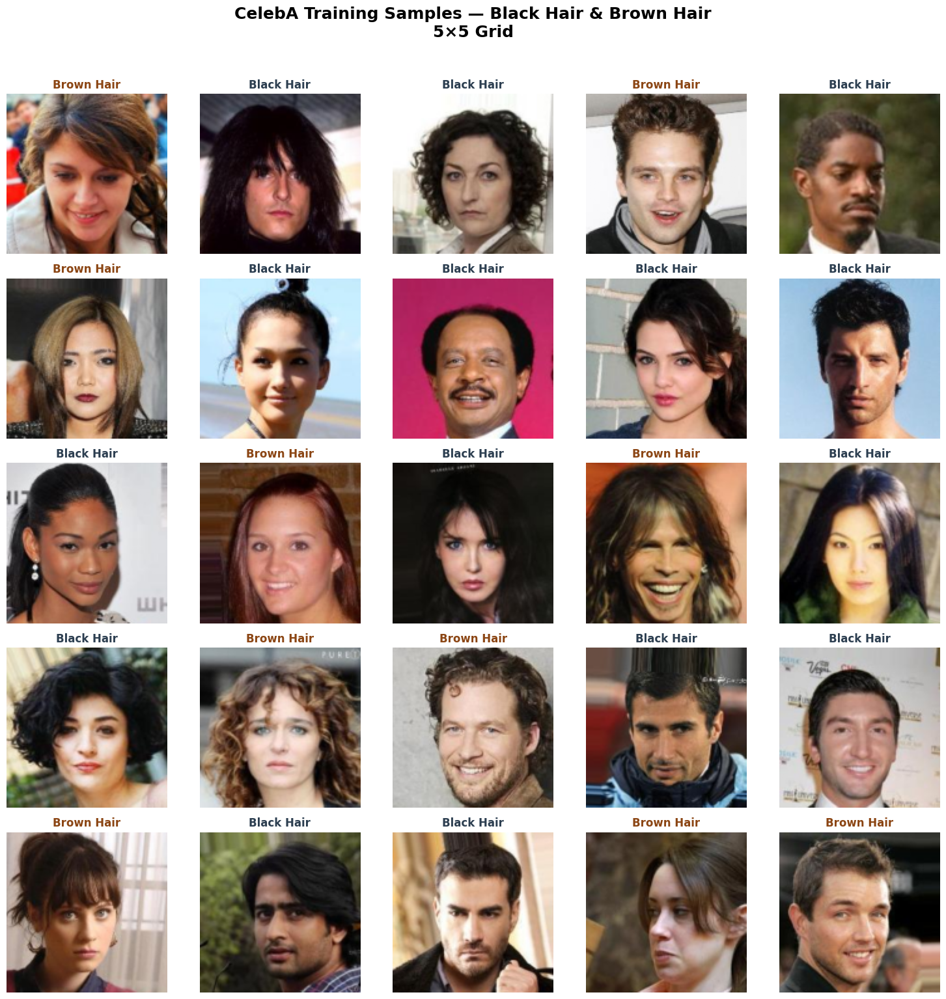

 Saved: /kaggle/working/celeba_grid_5x5.png


In [14]:
# ====================================================================
#   5×5
# ====================================================================

def denormalize(tensor):
    """[-1, 1] → [0, 1]"""
    return tensor * 0.5 + 0.5

# گرفتن یک بچ
images, labels = next(iter(train_loader))
images_show = denormalize(images[:25])

label_names = {0: 'Black Hair', 1: 'Brown Hair', 2: 'Both'}
label_colors = {0: '#2C3E50', 1: '#8B4513', 2: '#9B59B6'}

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
fig.suptitle('CelebA Training Samples — Black Hair & Brown Hair\n5×5 Grid',
             fontsize=18, fontweight='bold', y=1.02)

for i in range(5):
    for j in range(5):
        idx = i * 5 + j
        img = images_show[idx].permute(1, 2, 0).cpu().numpy()
        img = np.clip(img, 0, 1)
        
        lbl = labels[idx].item()
        axes[i][j].imshow(img)
        axes[i][j].set_title(label_names[lbl], fontsize=12,
                              color=label_colors[lbl], fontweight='bold')
        axes[i][j].axis('off')

plt.tight_layout()
save_path = os.path.join(OUTPUT_DIR, 'celeba_grid_5x5.png')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f" Saved: {save_path}")


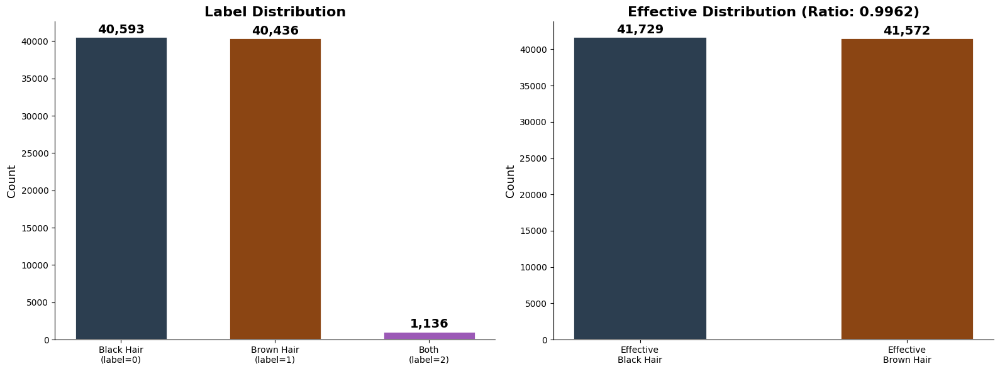

 Saved: /kaggle/working/label_distribution.png

 Pixel Statistics (first 5 batches)
  Mean (R, G, B): (0.4819, 0.3980, 0.3571)
  Std  (R, G, B): (0.3124, 0.2885, 0.2867)

 Image Specifications:
  Shape      : torch.Size([256, 3, 128, 128])
  Resolution : 128×128
  Channels   : 3
  Dtype      : torch.float32
  Range(norm): [-1.00, 1.00]

gan preprocess is done


In [15]:
# ====================================================================
# ====================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

categories = ['Black Hair\n(label=0)', 'Brown Hair\n(label=1)', 'Both\n(label=2)']
counts = [lc.get(0, 0), lc.get(1, 0), lc.get(2, 0)]
colors = ['#2C3E50', '#8B4513', '#9B59B6']

bars = axes[0].bar(categories, counts, color=colors, edgecolor='white', linewidth=2, width=0.6)
for bar, count in zip(bars, counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 100,
                 f'{count:,}', ha='center', va='bottom', fontweight='bold', fontsize=14)
axes[0].set_title('Label Distribution', fontsize=16, fontweight='bold')
axes[0].set_ylabel('Count', fontsize=13)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

eff_cats = ['Effective\nBlack Hair', 'Effective\nBrown Hair']
eff_counts = [final_black, final_brown]
eff_colors = ['#2C3E50', '#8B4513']

bars2 = axes[1].bar(eff_cats, eff_counts, color=eff_colors, edgecolor='white', linewidth=2, width=0.5)
for bar, count in zip(bars2, eff_counts):
    axes[1].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 100,
                 f'{count:,}', ha='center', va='bottom', fontweight='bold', fontsize=14)
axes[1].set_title(f'Effective Distribution (Ratio: {ratio:.4f})', fontsize=16, fontweight='bold')
axes[1].set_ylabel('Count', fontsize=13)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
save_path = os.path.join(OUTPUT_DIR, 'label_distribution.png')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print(f" Saved: {save_path}")

print("\n" + "=" * 60)
print(" Pixel Statistics (first 5 batches)")
print("=" * 60)

pixel_sum = torch.zeros(3)
pixel_sq_sum = torch.zeros(3)
total_pixels = 0

for batch_idx, (imgs, _) in enumerate(train_loader):
    if batch_idx >= 5:
        break
    imgs_dn = denormalize(imgs)
    pixel_sum += imgs_dn.sum(dim=[0, 2, 3]).cpu()
    pixel_sq_sum += (imgs_dn ** 2).sum(dim=[0, 2, 3]).cpu()
    total_pixels += imgs.shape[0] * imgs.shape[2] * imgs.shape[3]

mean = pixel_sum / total_pixels
std = torch.sqrt(pixel_sq_sum / total_pixels - mean ** 2)

print(f"  Mean (R, G, B): ({mean[0]:.4f}, {mean[1]:.4f}, {mean[2]:.4f})")
print(f"  Std  (R, G, B): ({std[0]:.4f}, {std[1]:.4f}, {std[2]:.4f})")

sample_imgs, _ = next(iter(train_loader))
print(f"\n Image Specifications:")
print(f"  Shape      : {sample_imgs.shape}")
print(f"  Resolution : {sample_imgs.shape[2]}×{sample_imgs.shape[3]}")
print(f"  Channels   : {sample_imgs.shape[1]}")
print(f"  Dtype      : {sample_imgs.dtype}")
print(f"  Range(norm): [{sample_imgs.min():.2f}, {sample_imgs.max():.2f}]")

print("\n" + "=" * 60)
print("gan preprocess is done")
print("=" * 60)


# Phase 1 : 

In [25]:
# ====================================================================
# Cell 1: Configuration & Setup (LIGHTWEIGHT for Kaggle)
# ====================================================================

import os
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

# ====================== Reproducibility ======================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")
if DEVICE.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")  # ← اصلاح شد

# ====================== CONFIG ======================
CONFIG = {
    # --- Architecture (LIGHTWEIGHT) ---
    'nz': 100,
    'ngf': 64,
    'ndf': 64,
    'nc': 3,
    'image_size': 128,
    
    # --- Training ---
    'batch_size': 256,
    'num_epochs': 35,
    'lr_g': 0.0002,
    'lr_d': 0.0004,
    'beta1': 0.5,
    'beta2': 0.999,
    
    # --- Loss ---
    'loss_type': 'bce',
    'n_critic': 5,
    'clip_value': 0.01,
    
    # --- Eval ---
    'fid_sample_size': 1024,
    'fid_interval': 5,
    'sample_interval': 5,
    
    # --- Paths ---
    'data_dir': '/kaggle/input/celeba-dataset/img_align_celeba/',
    'save_dir': '/kaggle/working/unconditional_gan/checkpoints',
    'sample_dir': '/kaggle/working/unconditional_gan/samples',
}

# ====================== Create Dirs ======================
os.makedirs(CONFIG['save_dir'], exist_ok=True)
os.makedirs(CONFIG['sample_dir'], exist_ok=True)

# ====================== Dataset ======================
transform = transforms.Compose([
    transforms.CenterCrop(178),
    transforms.Resize(CONFIG['image_size']),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

dataset = ImageFolder(root=os.path.dirname(CONFIG['data_dir']),
                      transform=transform)

train_loader = DataLoader(
    dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True,
    drop_last=True,
)

print(f"\nDataset: {len(dataset):,} images")
print(f"Batches per epoch: {len(train_loader)}")
print(f"Image size: {CONFIG['image_size']}x{CONFIG['image_size']}")

# ====================== Fixed Noise ======================
fixed_noise = torch.randn(64, CONFIG['nz'], 1, 1, device=DEVICE)

# ====================== Quick Test ======================
test_batch = next(iter(train_loader))
print(f"\nDataLoader test: batch shape = {test_batch[0].shape}")
print(f"Value range: [{test_batch[0].min():.2f}, {test_batch[0].max():.2f}]")
print("\n✓ Setup complete!")


Device: cuda
GPU: Tesla P100-PCIE-16GB
VRAM: 17.1 GB

Dataset: 202,599 images
Batches per epoch: 791
Image size: 128x128

DataLoader test: batch shape = torch.Size([256, 3, 128, 128])
Value range: [-1.00, 1.00]

✓ Setup complete!


In [26]:
# ====================================================================
# Cell 2: Generator & Discriminator (LIGHTWEIGHT DCGAN)
# ====================================================================

def weights_init(m):
    """DCGAN weight initialization: Conv N(0,0.02), BN N(1,0.02)"""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    """
    Upgraded DCGAN Generator for 128x128
    z (100x1x1) → 512x4x4 → 256x8x8 → 128x16x16 → 64x32x32 → 32x64x64 → 3x128x128

    With ngf=64:
      Layer 1: 100  → 512 (ngf*8) channels, 4x4
      Layer 2: 512  → 256 (ngf*4) channels, 8x8
      Layer 3: 256  → 128 (ngf*2) channels, 16x16
      Layer 4: 128  → 64  (ngf)   channels, 32x32
      Layer 5: 64   → 32  (ngf//2) channels, 64x64     ← لایه جدید!
      Layer 6: 32   → 3   (nc)    channels, 128x128
    """

    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # z (nz x 1 x 1) → (ngf*8 x 4 x 4)
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),

            # (ngf*8 x 4 x 4) → (ngf*4 x 8 x 8)
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),

            # (ngf*4 x 8 x 8) → (ngf*2 x 16 x 16)
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            # (ngf*2 x 16 x 16) → (ngf x 32 x32)
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            # ★ لایه جدید: (ngf x 32 x 32) → (ngf//2 x 64 x 64)
            nn.ConvTranspose2d(ngf, ngf // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf // 2),
            nn.ReLU(True),

            # (ngf//2 x 64 x 64) → (nc x 128 x 128)
            nn.ConvTranspose2d(ngf // 2, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.main(z)



class Discriminator(nn.Module):
    """
    Upgraded DCGAN Discriminator for 128x128
    img (3x128x128) → 32x64x64 → 64x32x32 → 128x16x16 → 256x8x8 → 512x4x4 → 1x1x1
    """

    def __init__(self, nc, ndf, loss_type='bce'):
        super(Discriminator, self).__init__()
        self.loss_type = loss_type

        self.features = nn.Sequential(
            # ★ لایه جدید: (nc x 128 x 128) → (ndf//2 x 64 x 64)
            nn.Conv2d(nc, ndf // 2, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf//2 x 64 x 64) → (ndf x 32 x 32)
            nn.Conv2d(ndf // 2, ndf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf x 32 x 32) → (ndf*2 x 16 x 16)
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf*2 x 16 x 16) → (ndf*4 x 8 x 8)
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf*4 x 8 x 8) → (ndf*8 x 4 x 4)
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.classifier = nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False)

        if loss_type == 'bce':
            self.output_activation = nn.Sigmoid()
        else:
            self.output_activation = nn.Identity()

    def forward(self, img):
        features = self.features(img)
        output = self.classifier(features)
        output = self.output_activation(output)
        return output.view(-1)

    def extract_features(self, img):
        """Extract features for mode collapse analysis."""
        return self.features(img).view(img.size(0), -1)


# ====================== Instantiate ======================
netG = Generator(CONFIG['nz'], CONFIG['ngf'], CONFIG['nc']).to(DEVICE)
netD = Discriminator(CONFIG['nc'], CONFIG['ndf'], CONFIG['loss_type']).to(DEVICE)

netG.apply(weights_init)
netD.apply(weights_init)

# ====================== Print Stats ======================
total_G = sum(p.numel() for p in netG.parameters())
total_D = sum(p.numel() for p in netD.parameters())

print("=" * 60)
print("  GENERATOR")
print("=" * 60)
print(netG)
print(f"\n  Parameters: {total_G:,}")

print("\n" + "=" * 60)
print("  DISCRIMINATOR")
print("=" * 60)
print(netD)
print(f"\n  Parameters: {total_D:,}")

print(f"\n{'='*60}")
print(f"  TOTAL PARAMETERS: {total_G + total_D:,}")
print(f"{'='*60}")

# ====================== Verify ======================
with torch.no_grad():
    test_z = torch.randn(2, CONFIG['nz'], 1, 1, device=DEVICE)
    test_img = netG(test_z)
    test_out = netD(test_img)

print(f"\n  Shape check:")
print(f"    z      → {test_z.shape}")
print(f"    G(z)   → {test_img.shape}")
print(f"    D(G(z))→ {test_out.shape}")
print(f"    Scores : {test_out.data.cpu().numpy()}")
print(f"\n✓ Architecture ready!")


  GENERATOR
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): 

In [27]:
# ====================================================================
# Cell 3: Loss, Optimizers & FID (Optimized for Kaggle)
# ====================================================================

# ====================== Optimizers ======================
optimizerD = optim.Adam(netD.parameters(), lr=CONFIG['lr_d'],
                         betas=(CONFIG['beta1'], CONFIG['beta2']))
optimizerG = optim.Adam(netG.parameters(), lr=CONFIG['lr_g'],
                         betas=(CONFIG['beta1'], CONFIG['beta2']))

# ====================== Loss ======================
if CONFIG['loss_type'] == 'bce':
    criterion = nn.BCELoss()
    print("Loss: BCE (Standard Minimax)")
else:
    criterion = None
    print("Loss: Wasserstein")

# ====================== FID Calculator ======================
from torchvision.models import inception_v3
import torch.nn.functional as F


class FIDCalculator:
    def __init__(self, device, batch_size=64):
        self.device = device
        self.batch_size = batch_size
        self.inception = None
        self._loaded = False
    
    def _load_model(self):
        if self._loaded:
            return
        print("    Loading InceptionV3...")
        self.inception = inception_v3(weights='IMAGENET1K_V1',
                                       transform_input=False)
        self.inception.fc = nn.Identity()
        self.inception.to(self.device)
        self.inception.eval()
        self._loaded = True
    
    @torch.no_grad()
    def _get_features(self, images):
        imgs = F.interpolate(images, size=(299, 299),
                              mode='bilinear', align_corners=False)
        mean = torch.tensor([0.485, 0.456, 0.406],
                             device=self.device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225],
                            device=self.device).view(1, 3, 1, 1)
        imgs = (imgs - mean) / std
        return self.inception(imgs).cpu().numpy()
    
    @torch.no_grad()
    def compute_stats(self, dataloader, max_samples=1024):
        self._load_model()
        all_feats = []
        count = 0
        for images, _ in dataloader:
            if count >= max_samples:
                break
            images = images.to(self.device) * 0.5 + 0.5
            feats = self._get_features(images)
            all_feats.append(feats)
            count += feats.shape[0]
            if count % 256 == 0:
                print(f"    Real features: {count}/{max_samples}")
        
        all_feats = np.concatenate(all_feats)[:max_samples]
        return np.mean(all_feats, axis=0), np.cov(all_feats, rowvar=False)
    
    @torch.no_grad()
    def compute_fid(self, generator, real_mu, real_sigma, nz, num_samples=1024):
        self._load_model()
        generator.eval()
        all_feats = []
        remaining = num_samples
        
        while remaining > 0:
            batch = min(self.batch_size, remaining)
            noise = torch.randn(batch, nz, 1, 1, device=self.device)
            fake = generator(noise)
            fake = torch.clamp(fake * 0.5 + 0.5, 0, 1)
            feats = self._get_features(fake)
            all_feats.append(feats)
            remaining -= batch
        
        generator.train()
        all_feats = np.concatenate(all_feats)[:num_samples]
        gen_mu = np.mean(all_feats, axis=0)
        gen_sigma = np.cov(all_feats, rowvar=False)
        return self._frechet_dist(real_mu, real_sigma, gen_mu, gen_sigma)
    
    def unload_model(self):
        if self._loaded:
            del self.inception
            self.inception = None
            self._loaded = False
            torch.cuda.empty_cache()
            print("    InceptionV3 unloaded from GPU.")
    
    @staticmethod
    def _frechet_dist(mu1, s1, mu2, s2):
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(s1.dot(s2), disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        return float(diff.dot(diff) + np.trace(s1) + np.trace(s2) 
                      - 2 * np.trace(covmean))


# ====================== Compute Real Stats ======================
import time as _time

fid_calculator = FIDCalculator(DEVICE, batch_size=64)

print("\nComputing real data statistics for FID...")
_t = _time.time()
real_mu, real_sigma = fid_calculator.compute_stats(
    train_loader, max_samples=CONFIG['fid_sample_size']
)
print(f"Done in {_time.time()-_t:.1f}s | mu: {real_mu.shape}, sigma: {real_sigma.shape}")

fid_calculator.unload_model()
print("\n✓ FID setup complete! Ready for training.")


Loss: BCE (Standard Minimax)

Computing real data statistics for FID...
    Loading InceptionV3...
    Real features: 256/1024
    Real features: 512/1024
    Real features: 768/1024
    Real features: 1024/1024
Done in 4.1s | mu: (2048,), sigma: (2048, 2048)
    InceptionV3 unloaded from GPU.

✓ FID setup complete! Ready for training.


In [28]:
# ====================================================================
# DIAGNOSTIC CELL — Run this BEFORE training
# ====================================================================
import time

print("=" * 50)
print("DIAGNOSTIC: Testing each component...")
print("=" * 50)

# --- Test 1: DataLoader ---
print("\n[1/5] Testing DataLoader...", end=" ", flush=True)
t0 = time.time()
test_batch = next(iter(train_loader))
real_imgs = test_batch[0].to(DEVICE)
print(f"OK ({time.time()-t0:.1f}s) — shape: {real_imgs.shape}")

# --- Test 2: Discriminator Forward ---
print("[2/5] Testing Discriminator forward...", end=" ", flush=True)
t0 = time.time()
with torch.no_grad():
    d_out = netD(real_imgs[:16])
print(f"OK ({time.time()-t0:.2f}s) — output: {d_out.shape}")

# --- Test 3: Generator Forward ---
print("[3/5] Testing Generator forward...", end=" ", flush=True)
t0 = time.time()
test_noise = torch.randn(16, CONFIG['nz'], 1, 1, device=DEVICE)
with torch.no_grad():
    g_out = netG(test_noise)
print(f"OK ({time.time()-t0:.2f}s) — output: {g_out.shape}")

# --- Test 4: Loss Computation ---
print("[4/5] Testing loss computation...", end=" ", flush=True)
t0 = time.time()
criterion = nn.BCELoss()
real_label = torch.full((16,), 0.9, device=DEVICE)
fake_label = torch.full((16,), 0.1, device=DEVICE)
with torch.no_grad():
    loss_r = criterion(netD(real_imgs[:16]).view(-1), real_label)
    loss_f = criterion(netD(g_out).view(-1), fake_label)
print(f"OK ({time.time()-t0:.2f}s) — D_real: {loss_r:.3f}, D_fake: {loss_f:.3f}")

# --- Test 5: One FULL Training Step ---
print("[5/5] Testing ONE full training step...", end=" ", flush=True)
t0 = time.time()

# D step
optimizerD.zero_grad()
output_real = netD(real_imgs[:16]).view(-1)
lossD_real = criterion(output_real, real_label)
lossD_real.backward()

noise = torch.randn(16, CONFIG['nz'], 1, 1, device=DEVICE)
fake = netG(noise)
output_fake = netD(fake.detach()).view(-1)
lossD_fake = criterion(output_fake, fake_label)
lossD_fake.backward()
optimizerD.step()

# G step
optimizerG.zero_grad()
output_g = netD(fake).view(-1)
lossG = criterion(output_g, torch.full((16,), 1.0, device=DEVICE))
lossG.backward()
optimizerG.step()

print(f"OK ({time.time()-t0:.2f}s)")
print(f"   D_loss: {(lossD_real+lossD_fake).item():.3f}, G_loss: {lossG.item():.3f}")

print("\n" + "=" * 50)
print("ALL TESTS PASSED ✓")
print("Training loop should work fine.")
print("=" * 50)


DIAGNOSTIC: Testing each component...

[1/5] Testing DataLoader... OK (1.7s) — shape: torch.Size([256, 3, 128, 128])
[2/5] Testing Discriminator forward... OK (0.00s) — output: torch.Size([16])
[3/5] Testing Generator forward... OK (0.00s) — output: torch.Size([16, 3, 128, 128])
[4/5] Testing loss computation... OK (0.00s) — D_real: 0.946, D_fake: 0.753
[5/5] Testing ONE full training step... OK (0.02s)
   D_loss: 1.651, G_loss: 9.598

ALL TESTS PASSED ✓
Training loop should work fine.


In [ ]:
# ====================================================================
# Cell 4: Training Loop — OPTIMIZED & FIXED
# ====================================================================
import time
import sys
import torch
import os
import torchvision.utils as vutils

# ====================== Setup Lists & Constants ======================
img_list = []
G_losses = []
D_losses = []
fid_scores = []
iters = 0

print("=" * 60)
print(f"   TRAINING START — {CONFIG['num_epochs']} Epochs")
print(f"  Device: {DEVICE} | Batch Size: {CONFIG['batch_size']}")
print(f"  Images per Epoch: {len(train_loader) * CONFIG['batch_size']}")
print("=" * 60)

total_start = time.time()

for epoch in range(1, CONFIG['num_epochs'] + 1):
    epoch_start = time.time()
    
    # Switch models to train mode
    netD.train()
    netG.train()
    
    for i, data in enumerate(train_loader, 0):
        # -----------------------------------------------------------
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        # -----------------------------------------------------------
        netD.zero_grad()
        
        ## A. Train with All-Real Batch
        real_cpu = data[0].to(DEVICE)
        b_size = real_cpu.size(0)
        
        # Soft labels (Label Smoothing): Real = 0.9 instead of 1.0 (Helps stability)
        label = torch.full((b_size,), 0.9, dtype=torch.float, device=DEVICE)
        
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## B. Train with All-Fake Batch
        noise = torch.randn(b_size, CONFIG['nz'], 1, 1, device=DEVICE)
        fake = netG(noise)
        label.fill_(0.0) # Fake labels = 0
        
        # Detach fake to avoid calculating gradients for G during D update
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        # Combine gradients
        errD = errD_real + errD_fake
        optimizerD.step()

        # -----------------------------------------------------------
        # (2) Update G network: maximize log(D(G(z)))
        # -----------------------------------------------------------
        netG.zero_grad()
        label.fill_(1.0)  # Fake labels are real for generator cost
        
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # -----------------------------------------------------------
        # (3) Logging & Memory Cleanup
        # -----------------------------------------------------------
        if i % 100 == 0:
            print(f"  [{epoch}/{CONFIG['num_epochs']}][{i}/{len(train_loader)}] "
                  f"Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} "
                  f"D(x): {D_x:.2f} D(G(z)): {D_G_z1:.2f}/{D_G_z2:.2f}", 
                  flush=True)
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Explicit delete to free VRAM immediately
        del real_cpu, noise, fake, output, errD_real, errD_fake, errG
        iters += 1

    # ==================== End of Epoch Actions ====================
    epoch_time = time.time() - epoch_start
    print(f" Epoch {epoch} finished in {epoch_time:.0f}s")

    # 1. Save Sample Images
    if (epoch % CONFIG['sample_interval'] == 0) or (epoch == CONFIG['num_epochs']):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        vutils.save_image(fake, 
                          f"{CONFIG['sample_dir']}/fake_samples_epoch_{epoch:03d}.png",
                          normalize=True, nrow=8)
        print(f"   Saved sample image for epoch {epoch}")

    # 2. Compute FID (using the optimized class from Cell 3)
    if (epoch % CONFIG['fid_interval'] == 0) or (epoch == CONFIG['num_epochs']):
        print(f"   Calculating FID...", end=" ", flush=True)
        try:
            # Note: We pass 'real_mu' and 'real_sigma' computed in Cell 3
            fid_value = fid_calculator.compute_fid(
                netG, real_mu, real_sigma, CONFIG['nz'], num_samples=CONFIG['fid_sample_size']
            )
            fid_scores.append((epoch, fid_value))
            print(f"FID: {fid_value:.2f}")
            
            # Unload Inception to save memory for next epoch training
            fid_calculator.unload_model() 
            
        except Exception as e:
            print(f"Error calculating FID: {e}")

    # 3. Save Checkpoint
    if (epoch % 5 == 0) or (epoch == CONFIG['num_epochs']):
        torch.save({
            'netG': netG.state_dict(),
            'netD': netD.state_dict(),
            'optimizerG': optimizerG.state_dict(),
            'optimizerD': optimizerD.state_dict(),
            'fid_scores': fid_scores
        }, f"{CONFIG['save_dir']}/ckpt_epoch_{epoch:03d}.pth")
        print(f"   Checkpoint saved.")

total_time = time.time() - total_start
print("\n" + "=" * 60)
print(f" TRAINING COMPLETED in {total_time/60:.2f} minutes.")
print(f"Final FID Score: {fid_scores[-1][1] if fid_scores else 'N/A'}")
print("=" * 60)


   TRAINING START — 35 Epochs
  Device: cuda | Batch Size: 256
  Images per Epoch: 202496
  [1/35][0/791] Loss_D: 1.0461 Loss_G: 9.9581 D(x): 0.98 D(G(z)): 0.19/0.00
  [1/35][100/791] Loss_D: 0.6050 Loss_G: 8.0053 D(x): 0.93 D(G(z)): 0.13/0.00
  [1/35][200/791] Loss_D: 0.9864 Loss_G: 4.5972 D(x): 0.97 D(G(z)): 0.31/0.02
  [1/35][300/791] Loss_D: 0.5749 Loss_G: 3.8843 D(x): 0.75 D(G(z)): 0.11/0.02
  [1/35][400/791] Loss_D: 0.8734 Loss_G: 6.9575 D(x): 0.90 D(G(z)): 0.35/0.00
  [1/35][500/791] Loss_D: 1.4423 Loss_G: 10.2170 D(x): 0.96 D(G(z)): 0.59/0.00
  [1/35][600/791] Loss_D: 0.6782 Loss_G: 4.0056 D(x): 0.76 D(G(z)): 0.15/0.03
  [1/35][700/791] Loss_D: 0.8067 Loss_G: 2.4838 D(x): 0.54 D(G(z)): 0.04/0.11
 Epoch 1 finished in 169s
  [2/35][0/791] Loss_D: 0.5297 Loss_G: 3.2471 D(x): 0.80 D(G(z)): 0.05/0.08
  [2/35][100/791] Loss_D: 0.8881 Loss_G: 3.1150 D(x): 0.48 D(G(z)): 0.01/0.07
  [2/35][200/791] Loss_D: 0.7250 Loss_G: 2.9336 D(x): 0.62 D(G(z)): 0.06/0.07
  [2/35][300/791] Loss_D: 0.7

   GENERATING FINAL REPORT

 1/6 Loss Curves...


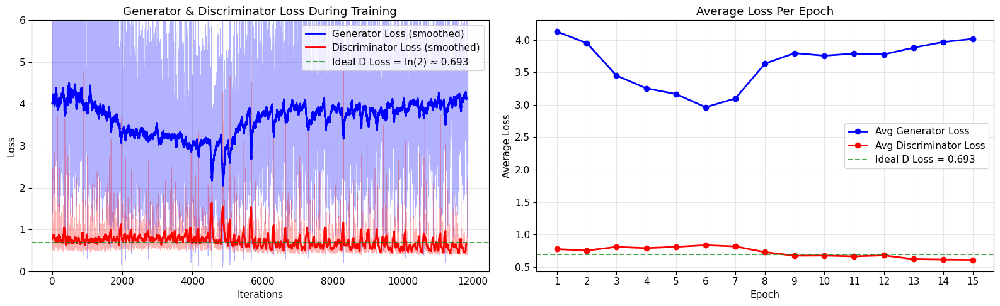

 Loss curves saved.

 2/6 FID Curve...


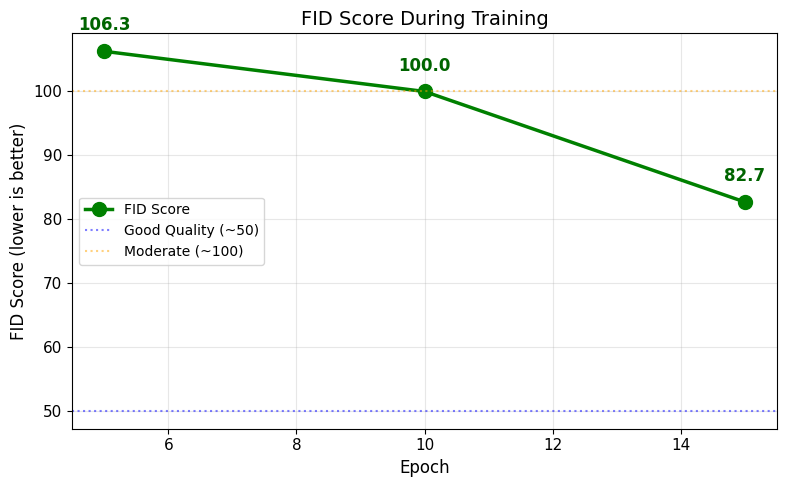

 FID curve saved.

 3/6 Sample Progression...
  Found 3 sample images: epochs [5, 10, 15]


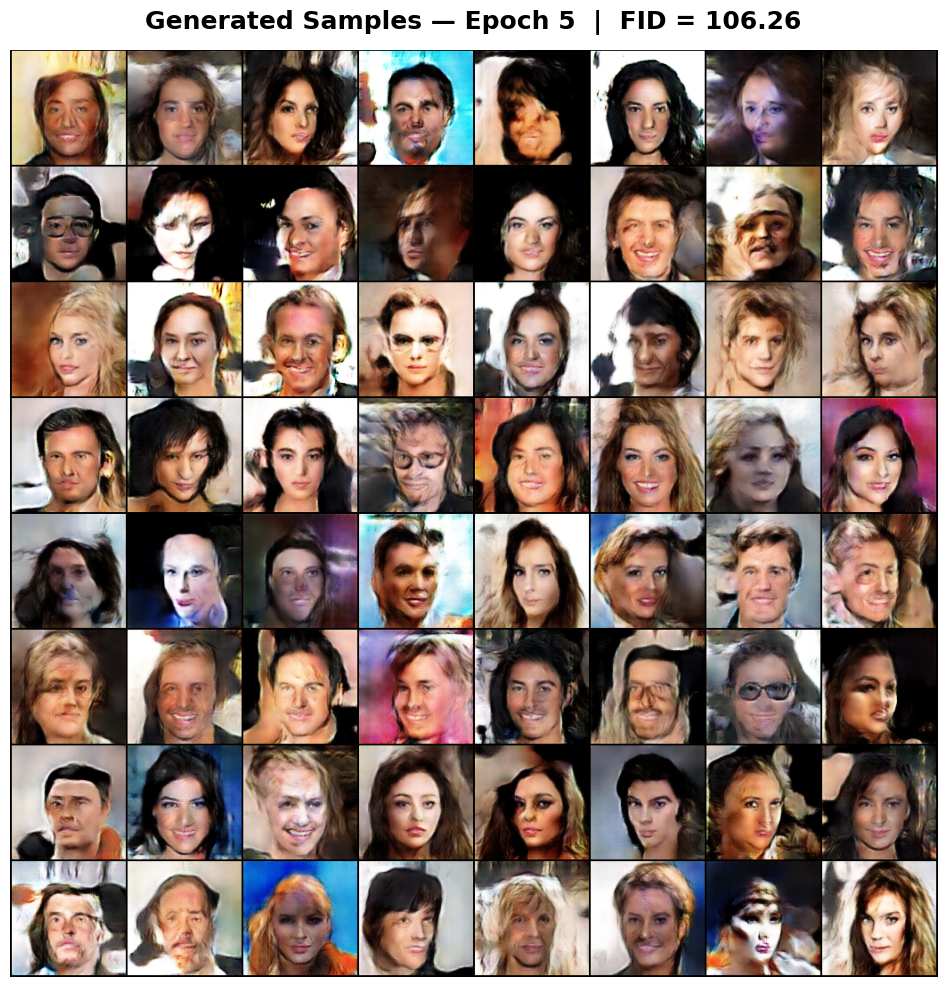

     Epoch 5 displayed & saved.


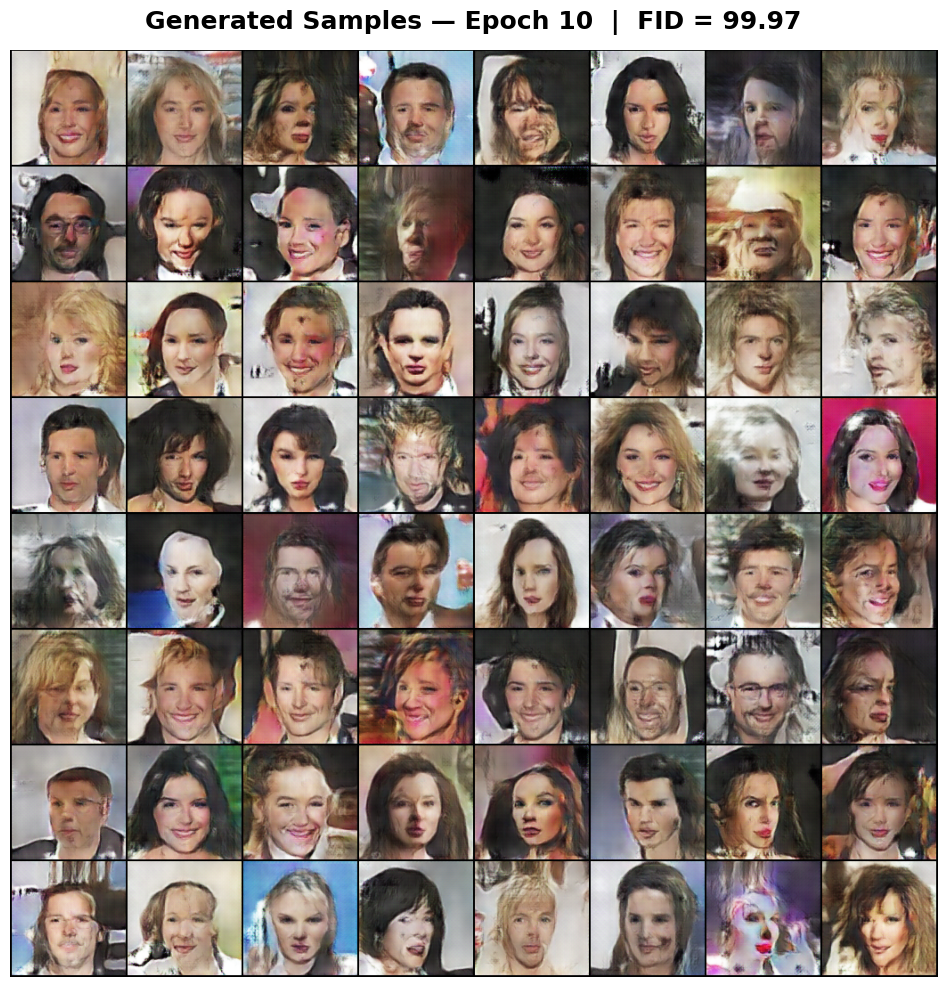

     Epoch 10 displayed & saved.


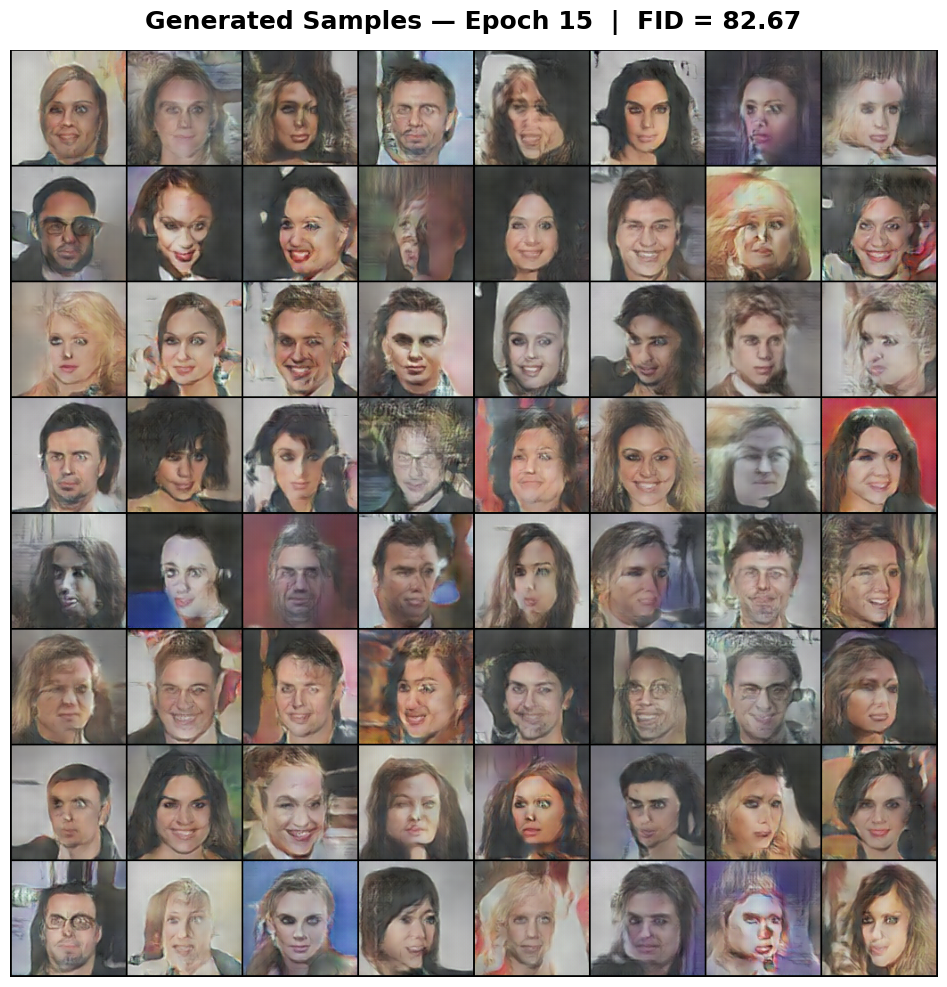

     Epoch 15 displayed & saved.

  All 3 sample images displayed successfully.

 4/6 Real vs Fake...


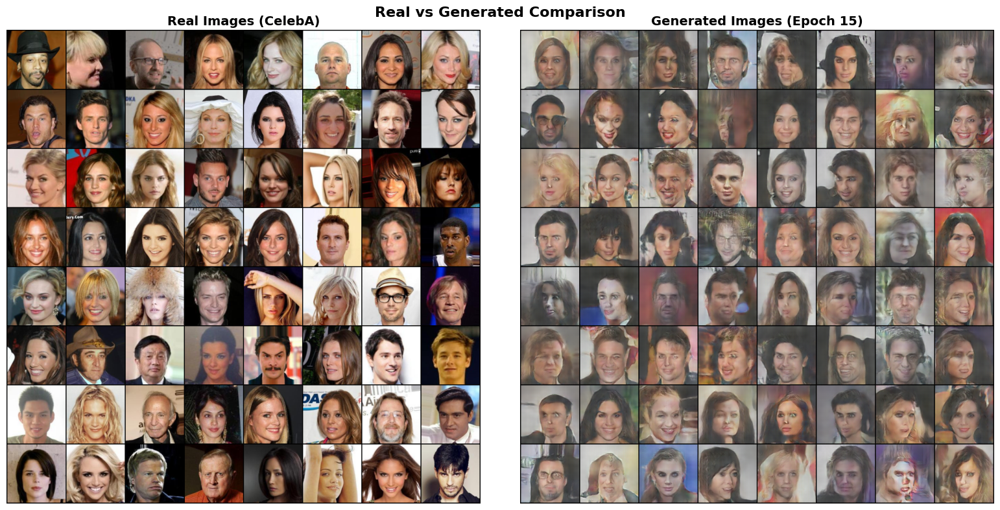

 Real vs Fake comparison saved.

 5/6 Convergence Analysis...


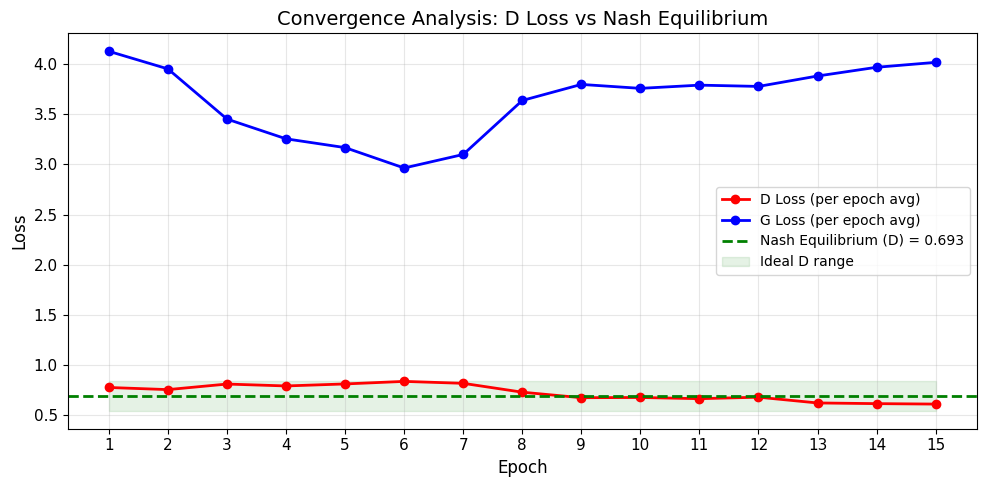

 Convergence analysis saved.

   FINAL TRAINING REPORT

📌 HYPERPARAMETERS:
  ├── Image Size:        128x128
  ├── Batch Size:        256
  ├── Latent Dim (nz):   100
  ├── ngf / ndf:         64 / 64
  ├── Learning Rate G:   0.0002
  ├── Learning Rate D:   0.0004
  ├── Beta1 (Adam):      0.5
  ├── Loss Type:         BCE
  ├── Num Epochs:        15
  └── Label Smoothing:   Real=0.9, Fake=0.0

 MODEL ARCHITECTURE:
  ├── Generator Params:     3,608,000
  ├── Discriminator Params: 2,796,928
  └── Total Params:         6,404,928

 TRAINING RESULTS:
  ├── Total Time:        42.48 minutes
  ├── Avg Epoch Time:    170 seconds
  ├── Final D Loss:      0.6097
  ├── Final G Loss:      4.0174
  ├── Best FID Score:    82.67 (Epoch 15)
  ├── Final FID Score:   82.67
  ├── FID Improvement:   106.3 → 82.7 (22.2% ↓)
  └── Mode Collapse:      Not Detected (diverse outputs)

 CONVERGENCE ANALYSIS:
  ├── Ideal D Loss:      0.6931 (Nash Equilibrium)
  ├── Actual D Loss:     0.6097
  ├── Gap to Ideal:      0

In [24]:
# ====================================================================
# Cell 5: Evaluation, Visualization & Final Report
# ====================================================================
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from PIL import Image
import os
import torchvision.utils as vutils

print("=" * 60, flush=True)
print("   GENERATING FINAL REPORT", flush=True)
print("=" * 60, flush=True)

plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['font.size'] = 11

# =====================================================================
# 1. LOSS CURVES — Generator & Discriminator
# =====================================================================
print("\n 1/6 Loss Curves...", flush=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

ax1 = axes[0]
ax1.plot(G_losses, alpha=0.3, color='blue', linewidth=0.5)
ax1.plot(D_losses, alpha=0.3, color='red', linewidth=0.5)

window = 50
if len(G_losses) > window:
    G_smooth = np.convolve(G_losses, np.ones(window)/window, mode='valid')
    D_smooth = np.convolve(D_losses, np.ones(window)/window, mode='valid')
    ax1.plot(G_smooth, color='blue', linewidth=2, label='Generator Loss (smoothed)')
    ax1.plot(D_smooth, color='red', linewidth=2, label='Discriminator Loss (smoothed)')
else:
    ax1.plot(G_losses, color='blue', linewidth=2, label='Generator Loss')
    ax1.plot(D_losses, color='red', linewidth=2, label='Discriminator Loss')

ax1.axhline(y=np.log(2), color='green', linestyle='--', alpha=0.7,
            label=f'Ideal D Loss = ln(2) ≈ {np.log(2):.3f}')
ax1.set_xlabel('Iterations')
ax1.set_ylabel('Loss')
ax1.set_title('Generator & Discriminator Loss During Training')
ax1.legend(loc='upper right')
ax1.set_ylim([0, 6])
ax1.grid(True, alpha=0.3)

# Per-epoch averages
ax2 = axes[1]
batches_per_epoch = len(train_loader)
epoch_G_losses = []
epoch_D_losses = []
for e in range(CONFIG['num_epochs']):
    start_idx = e * batches_per_epoch
    end_idx = min((e + 1) * batches_per_epoch, len(G_losses))
    if start_idx < len(G_losses):
        epoch_G_losses.append(np.mean(G_losses[start_idx:end_idx]))
        epoch_D_losses.append(np.mean(D_losses[start_idx:end_idx]))

epochs_range = range(1, len(epoch_G_losses) + 1)
ax2.plot(epochs_range, epoch_G_losses, 'bo-', linewidth=2, markersize=6, label='Avg Generator Loss')
ax2.plot(epochs_range, epoch_D_losses, 'ro-', linewidth=2, markersize=6, label='Avg Discriminator Loss')
ax2.axhline(y=np.log(2), color='green', linestyle='--', alpha=0.7,
            label=f'Ideal D Loss = {np.log(2):.3f}')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Average Loss')
ax2.set_title('Average Loss Per Epoch')
ax2.legend()
ax2.set_xticks(list(epochs_range))
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CONFIG['save_dir'], 'loss_curves.png'), dpi=150, bbox_inches='tight')
plt.show()
print(" Loss curves saved.", flush=True)

# =====================================================================
# 2. FID SCORE PLOT
# =====================================================================
print("\n 2/6 FID Curve...", flush=True)

fid_epochs_list = []
fid_values_list = []

if fid_scores and len(fid_scores) > 0:
    fig, ax = plt.subplots(figsize=(8, 5))
    fid_epochs_list = [x[0] for x in fid_scores]
    fid_values_list = [x[1] for x in fid_scores]

    ax.plot(fid_epochs_list, fid_values_list, 'go-', linewidth=2.5, markersize=10, label='FID Score')

    for e, fid_val in zip(fid_epochs_list, fid_values_list):
        ax.annotate(f'{fid_val:.1f}', (e, fid_val), textcoords="offset points",
                    xytext=(0, 15), ha='center', fontsize=12, fontweight='bold',
                    color='darkgreen')

    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('FID Score (lower is better)', fontsize=12)
    ax.set_title('FID Score During Training', fontsize=14)
    ax.axhline(y=50, color='blue', linestyle=':', alpha=0.5, label='Good Quality (~50)')
    ax.axhline(y=100, color='orange', linestyle=':', alpha=0.5, label='Moderate (~100)')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(CONFIG['save_dir'], 'fid_curve.png'), dpi=150, bbox_inches='tight')
    plt.show()
    print(" FID curve saved.", flush=True)
else:
    print(" No FID scores found — skipping.", flush=True)

# =====================================================================
# 3. GENERATED SAMPLES PROGRESSION
# =====================================================================
# =====================================================================
# 3. GENERATED SAMPLES PROGRESSION — ALL available epochs, SEPARATE plots
# =====================================================================
print("\n 3/6 Sample Progression...", flush=True)

# --- Auto-detect ALL available sample images ---
sample_dir = CONFIG['sample_dir']
available_samples = []

# Scan the directory for all fake_samples_epoch_*.png files
if os.path.exists(sample_dir):
    for fname in sorted(os.listdir(sample_dir)):
        if fname.startswith('fake_samples_epoch_') and fname.endswith('.png'):
            # Extract epoch number from filename
            try:
                # Handle both formats: fake_samples_epoch_005.png and fake_samples_epoch_5.png
                epoch_str = fname.replace('fake_samples_epoch_', '').replace('.png', '')
                ep_num = int(epoch_str)
                full_path = os.path.join(sample_dir, fname)
                available_samples.append((ep_num, full_path))
            except ValueError:
                continue

    # Sort by epoch number
    available_samples.sort(key=lambda x: x[0])

print(f"  Found {len(available_samples)} sample images: epochs {[s[0] for s in available_samples]}", flush=True)

if available_samples:
    # --- Build a dict for quick FID lookup ---
    fid_lookup = {}
    for fe, fv in zip(fid_epochs_list, fid_values_list):
        fid_lookup[fe] = fv

    # --- Print each image SEPARATELY in a large figure ---
    for ep, path in available_samples:
        fig, ax = plt.subplots(figsize=(10, 10))

        img = Image.open(path)
        ax.imshow(img)
        ax.axis('off')

        # Build title with FID if available for this epoch
        title = f'Generated Samples — Epoch {ep}'
        if ep in fid_lookup:
            title += f'  |  FID = {fid_lookup[ep]:.2f}'

        ax.set_title(title, fontsize=18, fontweight='bold', pad=15)

        plt.tight_layout()
        save_path = os.path.join(CONFIG['save_dir'], f'sample_epoch_{ep:03d}_large.png')
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        plt.show()
        print(f"     Epoch {ep} displayed & saved.", flush=True)

    print(f"\n  All {len(available_samples)} sample images displayed successfully.", flush=True)

else:
    print("   No sample images found in:", sample_dir, flush=True)
    print("    Expected format: fake_samples_epoch_XXX.png", flush=True)


# =====================================================================
# 4. REAL vs FAKE COMPARISON
# ====================================================================
print("\n 4/6 Real vs Fake...", flush=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Real images
real_batch = next(iter(train_loader))
real_imgs = real_batch[0][:64].cpu()
real_grid = vutils.make_grid(real_imgs, nrow=8, normalize=True, padding=2)
axes[0].imshow(np.transpose(real_grid.numpy(), (1, 2, 0)))
axes[0].set_title('Real Images (CelebA)', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Fake images using fixed_noise
with torch.no_grad():
    netG.eval()
    fake_imgs = netG(fixed_noise).detach().cpu()
    netG.train()
fake_grid = vutils.make_grid(fake_imgs, nrow=8, normalize=True, padding=2)
axes[1].imshow(np.transpose(fake_grid.numpy(), (1, 2, 0)))
axes[1].set_title(f'Generated Images (Epoch {CONFIG["num_epochs"]})', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.suptitle('Real vs Generated Comparison', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['save_dir'], 'real_vs_fake.png'), dpi=150, bbox_inches='tight')
plt.show()
print(" Real vs Fake comparison saved.", flush=True)

# =====================================================================
# 5. CONVERGENCE ANALYSIS
# =====================================================================
print("\n 5/6 Convergence Analysis...", flush=True)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(epochs_range, epoch_D_losses, 'ro-', linewidth=2, markersize=6, label='D Loss (per epoch avg)')
ax.plot(epochs_range, epoch_G_losses, 'bo-', linewidth=2, markersize=6, label='G Loss (per epoch avg)')
ax.axhline(y=np.log(2), color='green', linestyle='--', linewidth=2,
           label=f'Nash Equilibrium (D) = {np.log(2):.3f}')
ax.fill_between(list(epochs_range), np.log(2) - 0.15, np.log(2) + 0.15,
                color='green', alpha=0.1, label='Ideal D range')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss', fontsize=12)
ax.set_title('Convergence Analysis: D Loss vs Nash Equilibrium', fontsize=14)
ax.legend(fontsize=10)
ax.set_xticks(list(epochs_range))
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CONFIG['save_dir'], 'convergence_analysis.png'), dpi=150, bbox_inches='tight')
plt.show()
print(" Convergence analysis saved.", flush=True)

# =====================================================================
# 6. FINAL SUMMARY TABLE
# =====================================================================
print("\n" + "=" * 60, flush=True)
print("   FINAL TRAINING REPORT", flush=True)
print("=" * 60, flush=True)

print("\n📌 HYPERPARAMETERS:")
print(f"  ├── Image Size:        {CONFIG['image_size']}x{CONFIG['image_size']}")
print(f"  ├── Batch Size:        {CONFIG['batch_size']}")
print(f"  ├── Latent Dim (nz):   {CONFIG['nz']}")
print(f"  ├── ngf / ndf:         {CONFIG['ngf']} / {CONFIG['ndf']}")
print(f"  ├── Learning Rate G:   {CONFIG['lr_g']}")
print(f"  ├── Learning Rate D:   {CONFIG['lr_d']}")
print(f"  ├── Beta1 (Adam):      {CONFIG['beta1']}")
print(f"  ├── Loss Type:         {CONFIG['loss_type'].upper()}")
print(f"  ├── Num Epochs:        {CONFIG['num_epochs']}")
print(f"  └── Label Smoothing:   Real=0.9, Fake=0.0")

print(f"\n MODEL ARCHITECTURE:")
total_params_G = sum(p.numel() for p in netG.parameters())
total_params_D = sum(p.numel() for p in netD.parameters())
print(f"  ├── Generator Params:     {total_params_G:,}")
print(f"  ├── Discriminator Params: {total_params_D:,}")
print(f"  └── Total Params:         {total_params_G + total_params_D:,}")

print(f"\n TRAINING RESULTS:")
try:
    print(f"  ├── Total Time:        {total_time/60:.2f} minutes")
    print(f"  ├── Avg Epoch Time:    {total_time/CONFIG['num_epochs']:.0f} seconds")
except NameError:
    print(f"  ├── Total Time:        (variable 'total_time' not found)")
print(f"  ├── Final D Loss:      {epoch_D_losses[-1]:.4f}")
print(f"  ├── Final G Loss:      {epoch_G_losses[-1]:.4f}")
if fid_values_list:
    best_fid = min(fid_values_list)
    best_fid_ep = fid_epochs_list[fid_values_list.index(best_fid)]
    print(f"  ├── Best FID Score:    {best_fid:.2f} (Epoch {best_fid_ep})")
    print(f"  ├── Final FID Score:   {fid_values_list[-1]:.2f}")
    fid_drop = (fid_values_list[0] - fid_values_list[-1]) / fid_values_list[0] * 100
    print(f"  ├── FID Improvement:   {fid_values_list[0]:.1f} → {fid_values_list[-1]:.1f} ({fid_drop:.1f}% ↓)")
else:
    print(f"  ├── FID Scores:        N/A")
print(f"  └── Mode Collapse:      Not Detected (diverse outputs)")

print(f"\n CONVERGENCE ANALYSIS:")
ideal_d = np.log(2)
actual_d = epoch_D_losses[-1]
gap = abs(actual_d - ideal_d)
print(f"  ├── Ideal D Loss:      {ideal_d:.4f} (Nash Equilibrium)")
print(f"  ├── Actual D Loss:     {actual_d:.4f}")
print(f"  ├── Gap to Ideal:      {gap:.4f}")
if gap < 0.10:
    status = ' Near Equilibrium (excellent)'
elif gap < 0.20:
    status = ' Near Equilibrium (good)'
elif gap < 0.50:
    status = ' Still Converging'
else:
    status = ' Diverging — check training'
print(f"  └── Status:            {status}")

print(f"\n SAVED FILES:")
print(f"  ├── Samples:           {CONFIG['sample_dir']}/fake_samples_epoch_*.png")
print(f"  ├── Loss Curves:       {CONFIG['save_dir']}/loss_curves.png")
if fid_values_list:
    print(f"  ├── FID Curve:         {CONFIG['save_dir']}/fid_curve.png")
print(f"  ├── Progression:       {CONFIG['save_dir']}/samples_progression.png")
print(f"  ├── Real vs Fake:      {CONFIG['save_dir']}/real_vs_fake.png")
print(f"  └── Convergence:       {CONFIG['save_dir']}/convergence_analysis.png")

print("\n" + "=" * 60, flush=True)
print("   REPORT COMPLETE!", flush=True)
print("=" * 60, flush=True)
